In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
import plotly.offline as py
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
from chart_studio.plotly import iplot
import plotly_express as px
import plotly.io as pio
from wordcloud import WordCloud, ImageColorGenerator
#pio.templates
import calmap
import folium

In [2]:
symptoms={'symptom':['Fever','Dry cough','Fatigue','Sputum production','Shortness of breath',
        'Muscle pain','Sore throat','Headache','Chills','Nausea or vomiting',
        'Nasal congestion','Diarrhoea','Haemoptysis','Conjunctival congestion',
        'Loss of appetite','Body aches','Mucus or phlegm'],
        'percentage':[87.9,67.7,38.1,33.4,18.6,14.8,13.9,13.6,11.4,5.0,4.8,3.7,0.9,0.8,40,35,27]}

In [3]:
symptoms=pd.DataFrame(data=symptoms,index=range(17))
symptoms

,symptom,percentage
0,Fever,87.9
1,Dry cough,67.7
2,Fatigue,38.1
3,Sputum production,33.4
4,Shortness of breath,18.6
5,Muscle pain,14.8
6,Sore throat,13.9
7,Headache,13.6
8,Chills,11.4
9,Nausea or vomiting,5.0


# Bar Representation of Symptoms

In [4]:
symp_representation = px.bar(symptoms[['symptom', 'percentage']].sort_values('percentage', ascending=False), 
             y="percentage", x="symptom", color='symptom', 
             log_y=True, template='gridon', title='Symptom of Covid-19')
symp_representation.show()

# Pie Representation 

In [5]:
symp_representation = px.pie(symptoms,values="percentage",names="symptom",template="plotly_dark")
symp_representation.update_traces(rotation=45, pull=0.03, textinfo="percent+label")
symp_representation.show()

# Text Representation

<Figure size 864x432 with 0 Axes>

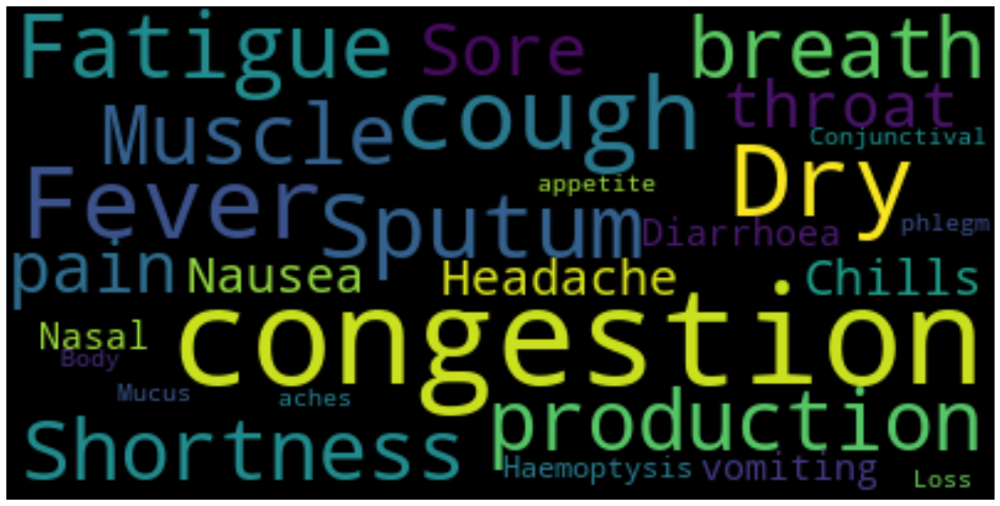

In [6]:
text = " ".join(str(each) for each in symptoms.symptom)
wordcloud = WordCloud(max_words=200,colormap='viridis', background_color="black").generate(text)
plt.figure(figsize=(12,6))
plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation='Bilinear')
plt.axis("off")
plt.figure(1,figsize=(15, 15))
plt.show()

In [7]:
data= pd.read_csv('covid19_italy_region.csv',
                 names = ['SNo', 'Date', 'Country', 'RegionCode', 'RegionName', 'Latitude',
               'Longitude', 'HospitalizedPatients', 'IntensiveCarePatients',
               'TotalHospitalizedPatients', 'HomeConfinement', 'CurrentPositiveCases',
               'NewPositiveCases', 'Recovered', 'Deaths', 'TotalPositiveCases',
               'TestsPerformed'],
                header=0,
                index_col=False)
data.head()

,SNo,Date,Country,RegionCode,RegionName,Latitude,Longitude,HospitalizedPatients,IntensiveCarePatients,TotalHospitalizedPatients,HomeConfinement,CurrentPositiveCases,NewPositiveCases,Recovered,Deaths,TotalPositiveCases,TestsPerformed
0,0,2020-02-24T18:00:00,ITA,13,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,NaN
1,1,2020-02-24T18:00:00,ITA,17,Basilicata,40.639471,15.805148,0,0,0,0,0,0,0,0,0,NaN
2,2,2020-02-24T18:00:00,ITA,4,P.A. Bolzano,46.499335,11.356624,0,0,0,0,0,0,0,0,0,NaN
3,3,2020-02-24T18:00:00,ITA,18,Calabria,38.905976,16.594402,0,0,0,0,0,0,0,0,0,NaN
4,4,2020-02-24T18:00:00,ITA,15,Campania,40.839566,14.250850,0,0,0,0,0,0,0,0,0,NaN


In [8]:
data.columns

Index(['SNo', 'Date', 'Country', 'RegionCode', 'RegionName', 'Latitude',
       'Longitude', 'HospitalizedPatients', 'IntensiveCarePatients',
       'TotalHospitalizedPatients', 'HomeConfinement', 'CurrentPositiveCases',
       'NewPositiveCases', 'Recovered', 'Deaths', 'TotalPositiveCases',
       'TestsPerformed'],
      dtype='object')

In [9]:
data.describe()

,SNo,RegionCode,Latitude,Longitude,HospitalizedPatients,IntensiveCarePatients,TotalHospitalizedPatients,HomeConfinement,CurrentPositiveCases,NewPositiveCases,Recovered,Deaths,TotalPositiveCases,TestsPerformed
count,1491.000000,1491.000000,1491.000000,1491.000000,1491.000000,1491.000000,1491.000000,1491.000000,1491.000000,1491.000000,1491.000000,1491.000000,1491.000000,336.000000
mean,745.000000,10.190476,43.046293,12.225955,826.923541,105.458082,932.381623,1997.873910,2930.255533,142.139504,1164.668679,587.352113,4682.276325,57763.869048
std,430.558939,5.797008,2.489616,2.659840,1901.259449,205.251959,2101.409403,3968.853396,5816.472828,293.999141,3356.521383,1852.671995,10791.466812,57302.926209
min,0.000000,1.000000,38.115697,7.320149,0.000000,0.000000,0.000000,0.000000,0.000000,-18.000000,0.000000,0.000000,0.000000,3482.000000
25%,372.500000,5.000000,41.125596,11.121231,32.500000,6.000000,40.000000,77.500000,137.000000,7.000000,2.000000,4.000000,159.500000,20048.750000
50%,745.000000,10.000000,43.616760,12.388247,165.000000,31.000000,196.000000,600.000000,823.000000,44.000000,92.000000,71.000000,1139.000000,33993.500000
75%,1117.500000,15.000000,45.434905,13.768136,671.000000,111.000000,785.000000,1894.000000,2878.000000,129.000000,744.000000,312.000000,3812.000000,86095.750000
max,1490.000000,20.000000,46.499335,16.867367,12077.000000,1381.000000,13328.000000,30361.000000,37307.000000,3251.000000,26504.000000,14294.000000,78105.000000,251661.000000


In [10]:
province= pd.read_csv('covid19_italy_province.csv',
                  names = ['SNo','Date', 'Country', 'RegionCode', 'Region','ProvinceCode','Province','ProvinceAbbreviation', 'Lat', 'Long', 'Confirmed'], 
                  header=0,
                  index_col=False)

province.head()

,SNo,Date,Country,RegionCode,Region,ProvinceCode,Province,ProvinceAbbreviation,Lat,Long,Confirmed
0,0,2020-02-24T18:00:00,ITA,13,Abruzzo,69,Chieti,CH,42.351032,14.167546,0
1,1,2020-02-24T18:00:00,ITA,13,Abruzzo,66,L'Aquila,AQ,42.351222,13.398438,0
2,2,2020-02-24T18:00:00,ITA,13,Abruzzo,68,Pescara,PE,42.464584,14.213648,0
3,3,2020-02-24T18:00:00,ITA,13,Abruzzo,67,Teramo,TE,42.658918,13.704400,0
4,4,2020-02-24T18:00:00,ITA,13,Abruzzo,979,In fase di definizione/aggiornamento,NaN,0.000000,0.000000,0


In [11]:
province.columns

Index(['SNo', 'Date', 'Country', 'RegionCode', 'Region', 'ProvinceCode',
       'Province', 'ProvinceAbbreviation', 'Lat', 'Long', 'Confirmed'],
      dtype='object')

In [12]:
province.describe()

,SNo,RegionCode,ProvinceCode,Lat,Long,Confirmed
count,9088.000000,9088.000000,9088.000000,9088.000000,9088.000000,9088.000000
mean,4543.500000,10.140625,207.523438,35.868843,10.112000,768.160761
std,2623.623957,5.914734,347.402142,16.072408,5.097873,1740.247417
min,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,2271.750000,5.000000,32.750000,38.848542,8.583304,7.000000
50%,4543.500000,9.000000,64.500000,42.609815,11.188560,170.000000
75%,6815.250000,15.250000,96.250000,44.947714,13.593962,730.250000
max,9087.000000,20.000000,999.000000,46.499335,18.171897,20254.000000


# Cases

In [13]:
cases = ['TotalPositiveCases', 'Deaths', 'Recovered', 'Active']

# Active Case = confirmed - deaths - recovered
data['Active'] = data['TotalPositiveCases'] - data['Deaths'] - data['Recovered']

In [14]:
data.head()

,SNo,Date,Country,RegionCode,RegionName,Latitude,Longitude,HospitalizedPatients,IntensiveCarePatients,TotalHospitalizedPatients,HomeConfinement,CurrentPositiveCases,NewPositiveCases,Recovered,Deaths,TotalPositiveCases,TestsPerformed,Active
0,0,2020-02-24T18:00:00,ITA,13,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,NaN,0
1,1,2020-02-24T18:00:00,ITA,17,Basilicata,40.639471,15.805148,0,0,0,0,0,0,0,0,0,NaN,0
2,2,2020-02-24T18:00:00,ITA,4,P.A. Bolzano,46.499335,11.356624,0,0,0,0,0,0,0,0,0,NaN,0
3,3,2020-02-24T18:00:00,ITA,18,Calabria,38.905976,16.594402,0,0,0,0,0,0,0,0,0,NaN,0
4,4,2020-02-24T18:00:00,ITA,15,Campania,40.839566,14.250850,0,0,0,0,0,0,0,0,0,NaN,0


# Table representation

In [15]:
covid19=data.groupby('RegionName')['HospitalizedPatients', 'IntensiveCarePatients', 'TotalHospitalizedPatients',
       'HomeConfinement', 'TotalPositiveCases', 'NewPositiveCases',
       'Recovered', 'Deaths', 'TestsPerformed', 'Active'].sum().reset_index()
covid19.sort_values(by='TotalPositiveCases',ascending=False,inplace=True)
covid19.style.background_gradient(cmap='Reds')

C:\Users\Saabia\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,RegionName,HospitalizedPatients,IntensiveCarePatients,TotalHospitalizedPatients,HomeConfinement,TotalPositiveCases,NewPositiveCases,Recovered,Deaths,TestsPerformed,Active
8,Lombardia,530268,57675,587943,885164,2718957,78099,780642,465208,3373824.000000,1473107
4,Emilia-Romagna,159739,15796,175535,380657,892009,26175,222379,113438,1773883.000000,556192
13,Piemonte,147011,17246,164257,369756,754848,27622,141257,79578,1563331.000000,534013
20,Veneto,66864,12359,79223,338284,615757,18372,158969,39281,3063386.000000,417507
17,Toscana,43163,10950,54113,186888,311388,9601,48218,22169,1611851.000000,241001
7,Liguria,44245,6437,50682,89886,245930,8412,71766,33596,452952.000000,140568
9,Marche,42616,6281,48897,106450,233666,6363,48399,29920,564574.000000,155347
6,Lazio,57648,7515,65163,96278,211121,6846,37019,12661,1262554.000000,161441
3,Campania,24215,3981,28196,85849,148395,4498,23770,10580,668808.000000,114045
12,P.A. Trento,13523,2462,15985,59695,129456,4258,41539,12237,324482.000000,75680


# Cumulative Result


In [16]:
cumulativeResult=covid19.sum().reset_index()
cumulativeResult.drop([0,9,3,6,10,5],inplace=True)
cumulativeResult.rename(columns={'index':'Detection',0 :'Total'},inplace=True)
cumulativeResult.style.background_gradient(cmap='PuBu')

,Detection,Total
1,HospitalizedPatients,1232943
2,IntensiveCarePatients,157238
4,HomeConfinement,2978830
7,Recovered,1736521
8,Deaths,875742


# Cumulative Result in Pie Representation

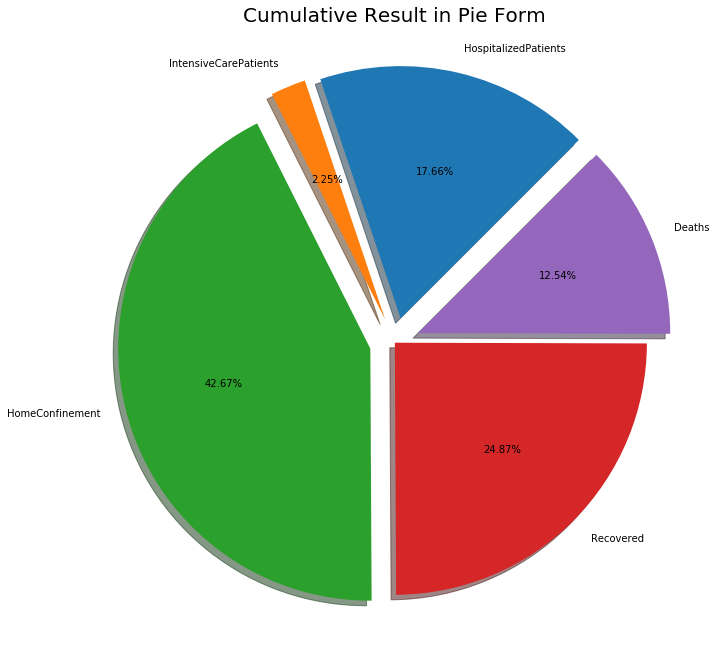

In [17]:
Totals=cumulativeResult['Total'].values.tolist()
labels=cumulativeResult['Detection'].values.tolist()
explode = (0.1, 0.1 , 0.1, 0, 0.1)  
fig, c = plt.subplots(figsize=(10,10))

c.pie(Totals, explode=explode,labels=labels, autopct='%1.2f%%',
        shadow=True, startangle=45, frame=False)
c.set_title('Cumulative Result in Pie Form',fontsize=20)
plt.tight_layout()
plt.show()

# Map Representation of Italy

In [18]:
map_representation = province.groupby(['Date', 'Province'])['Lat','Long','Confirmed'].max()
map_representation.head()

C:\Users\Saabia\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



Lat       Long  Confirmed
Date                Province                                    
2020-02-24T18:00:00 Agrigento    37.309711  13.584575          0
                    Alessandria  44.912974   8.615401          0
                    Ancona       43.616760  13.518875          0
                    Aosta        45.737503   7.320149          0
                    Arezzo       43.466428  11.882288          0

In [19]:
map_representation = map_representation.reset_index()
map_representation['size'] = map_representation['Confirmed'].pow(0.2)
map_representation.head()

,Date,Province,Lat,Long,Confirmed,size
0,2020-02-24T18:00:00,Agrigento,37.309711,13.584575,0,0.0
1,2020-02-24T18:00:00,Alessandria,44.912974,8.615401,0,0.0
2,2020-02-24T18:00:00,Ancona,43.616760,13.518875,0,0.0
3,2020-02-24T18:00:00,Aosta,45.737503,7.320149,0,0.0
4,2020-02-24T18:00:00,Arezzo,43.466428,11.882288,0,0.0


In [20]:
italy_map = map_representation.reset_index()
italy_map['size'] = italy_map['Confirmed'].pow(0.5)
italy_map.head()
fig = px.scatter_mapbox(italy_map, lat="Lat", lon="Long",
                     color="Confirmed", size='size', hover_name="Province", hover_data=['Confirmed'],
                     color_continuous_scale='matter',
                     animation_frame="Date", 
                     title='Total no. of cases spread in Italy over time')
fig.update(layout_coloraxis_showscale=True)
fig.update_layout(mapbox_style="carto-positron", mapbox_zoom=4, )
fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
fig.show()

In [21]:
m = folium.Map(location=[41.8719, 12.5674], tiles='cartodbpositron',
               min_zoom=5, max_zoom=10, zoom_start=5)
for i in range(0, len(data)):
    folium.Circle(location=[data.iloc[i]['Latitude'],data.iloc[i]['Longitude']],
        color='black',fill = True,fill_color='red',
        tooltip =   '<li><bold>Country : '+str(data.iloc[i]['Country'])+
                    '<li><bold>Region : '+str(data.iloc[i]['RegionName'])+
                    '<li><bold>Total Positive Cases : '+str(data.iloc[i]['TotalPositiveCases'])+
                    '<li><bold>Deaths : '+str(data.iloc[i]['Deaths'])+
                    '<li><bold>Recovered : '+str(data.iloc[i]['Recovered']),
        radius=int(data.iloc[i]['TotalPositiveCases'])**1).add_to(m)
m

# Latest Updation

In [22]:
latest_data_grouped = data.groupby('RegionName')['TotalPositiveCases', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
latest_data_grouped.style.background_gradient(cmap='Reds')

C:\Users\Saabia\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,RegionName,TotalPositiveCases,Deaths,Recovered,Active
0,Abruzzo,93303,9019,12211,72073
1,Basilicata,12966,705,2394,9867
2,Calabria,38788,2594,4739,31455
3,Campania,148395,10580,23770,114045
4,Emilia-Romagna,892009,113438,222379,556192
5,Friuli Venezia Giulia,105231,8529,39435,57267
6,Lazio,211121,12661,37019,161441
7,Liguria,245930,33596,71766,140568
8,Lombardia,2718957,465208,780642,1473107
9,Marche,233666,29920,48399,155347


# Region-wise Data i.e. Confirmed, Deceased, Recovered and Active cases by Region



In [23]:
by_region = latest_data_grouped.sort_values(by='TotalPositiveCases', ascending=False)
by_region = latest_data_grouped.reset_index(drop=True)
by_region.style.background_gradient(cmap='Reds')

,RegionName,TotalPositiveCases,Deaths,Recovered,Active
0,Abruzzo,93303,9019,12211,72073
1,Basilicata,12966,705,2394,9867
2,Calabria,38788,2594,4739,31455
3,Campania,148395,10580,23770,114045
4,Emilia-Romagna,892009,113438,222379,556192
5,Friuli Venezia Giulia,105231,8529,39435,57267
6,Lazio,211121,12661,37019,161441
7,Liguria,245930,33596,71766,140568
8,Lombardia,2718957,465208,780642,1473107
9,Marche,233666,29920,48399,155347


In [24]:
death_rep = by_region[by_region['Deaths']>0][['RegionName', 'Deaths']]
death_rep.sort_values('Deaths', ascending=False).reset_index(drop=True).style.background_gradient(cmap='Reds')

,RegionName,Deaths
0,Lombardia,465208
1,Emilia-Romagna,113438
2,Piemonte,79578
3,Veneto,39281
4,Liguria,33596
5,Marche,29920
6,Toscana,22169
7,Lazio,12661
8,P.A. Trento,12237
9,Puglia,11215


In [25]:
case_positv = by_region[by_region['TotalPositiveCases']>0][['RegionName', 'TotalPositiveCases']]
case_positv.sort_values('TotalPositiveCases', ascending=False).reset_index(drop=True).style.background_gradient(cmap='Reds')

,RegionName,TotalPositiveCases
0,Lombardia,2718957
1,Emilia-Romagna,892009
2,Piemonte,754848
3,Veneto,615757
4,Toscana,311388
5,Liguria,245930
6,Marche,233666
7,Lazio,211121
8,Campania,148395
9,P.A. Trento,129456


# Various representation 

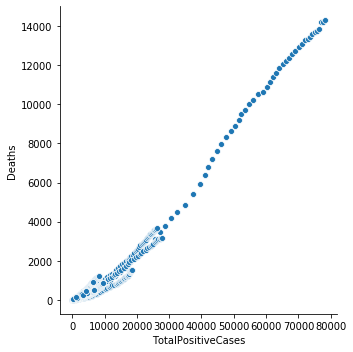

In [26]:
sns.relplot(x='TotalPositiveCases', y='Deaths', data=data, )

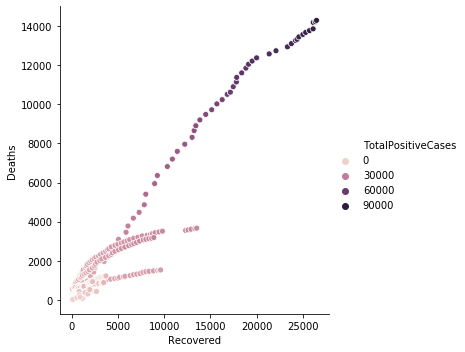

In [27]:
sns.relplot(x='Recovered', y='Deaths', data=data, hue='TotalPositiveCases')

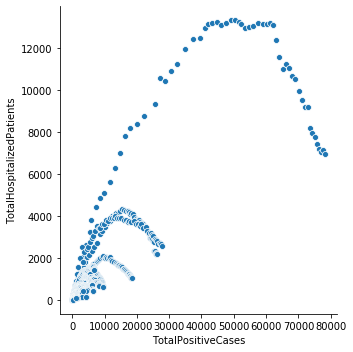

In [28]:
sns.relplot(x='TotalPositiveCases',y='TotalHospitalizedPatients', data=data, )

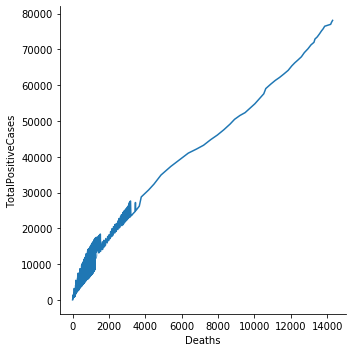

In [29]:
sns.relplot(x='Deaths',y='TotalPositiveCases', data=data, kind='line')

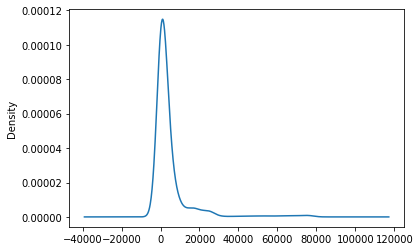

In [30]:
data['TotalPositiveCases'].plot.density()

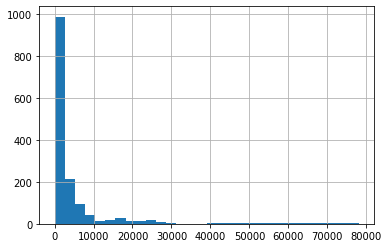

In [31]:
data['TotalPositiveCases'].hist(bins=30)

In [32]:
import cufflinks as cf
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

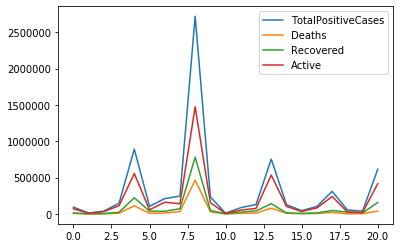

In [33]:
by_region.plot()

In [34]:
by_region.iplot()

In [35]:
data.iplot(kind='scatter', x='TotalPositiveCases', y='Deaths', mode='markers', size=10)

In [36]:
by_region.iplot(kind='bar')

In [37]:
data.count().iplot(kind='bar')

In [38]:
data.sum().iplot(kind='bar')

In [39]:
by_region.sum().iplot(kind='bar')

In [40]:
by_region.iplot(kind='box')

In [41]:
by_region[['TotalPositiveCases','Recovered','Deaths']].iplot(kind='spread')

C:\Users\Saabia\Anaconda3\lib\site-packages\cufflinks\plotlytools.py:850: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



[(0, 84204.53303921528)]

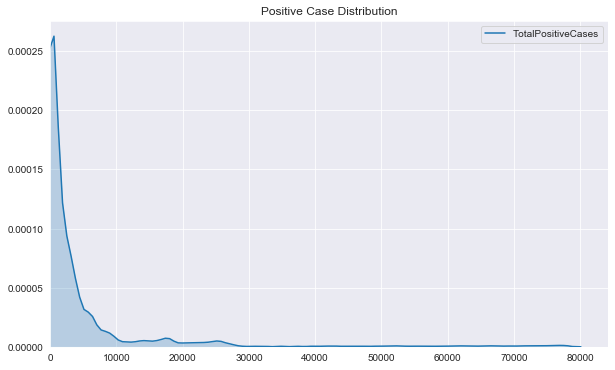

In [42]:
plt.figure(figsize=(10,6))
sns.set_style("darkgrid")
plt.title("Positive Case Distribution")
sns.kdeplot(data=data['TotalPositiveCases'], shade=True).set(xlim=(0))

# Confirmed, Recovered, Death and Active cases representation through Graph

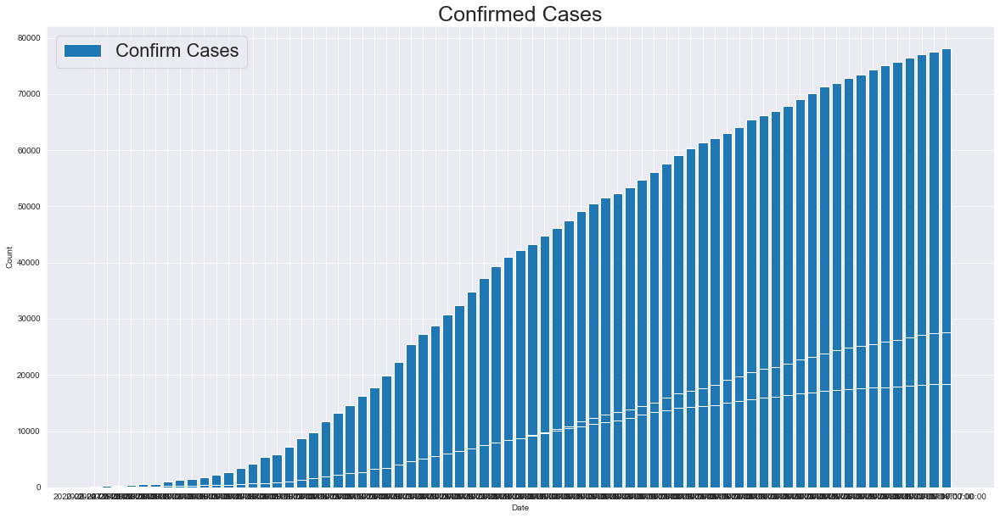

In [43]:
plt.figure(figsize=(20,10))
plt.bar(data.Date, data.TotalPositiveCases,label="Confirm Cases")
plt.xlabel('Date')
plt.ylabel("Count")
plt.legend(frameon=True, fontsize=22)
plt.title('Confirmed Cases',fontsize = 25)
plt.show()

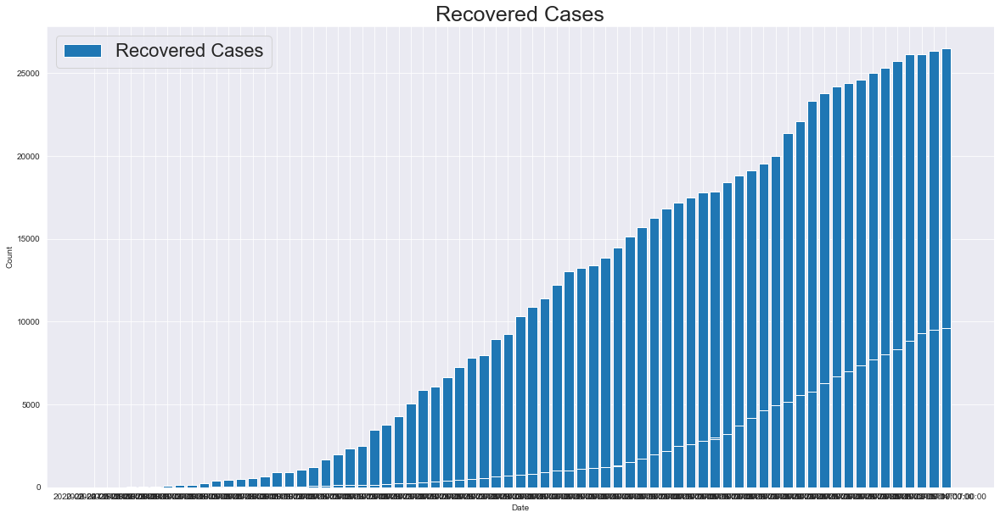

In [44]:
plt.figure(figsize=(20,10))
plt.bar(data.Date, data.Recovered,label="Recovered Cases")
plt.xlabel('Date')
plt.ylabel("Count")
plt.legend(frameon=True, fontsize=22)
plt.title('Recovered Cases',fontsize = 25)
plt.show()

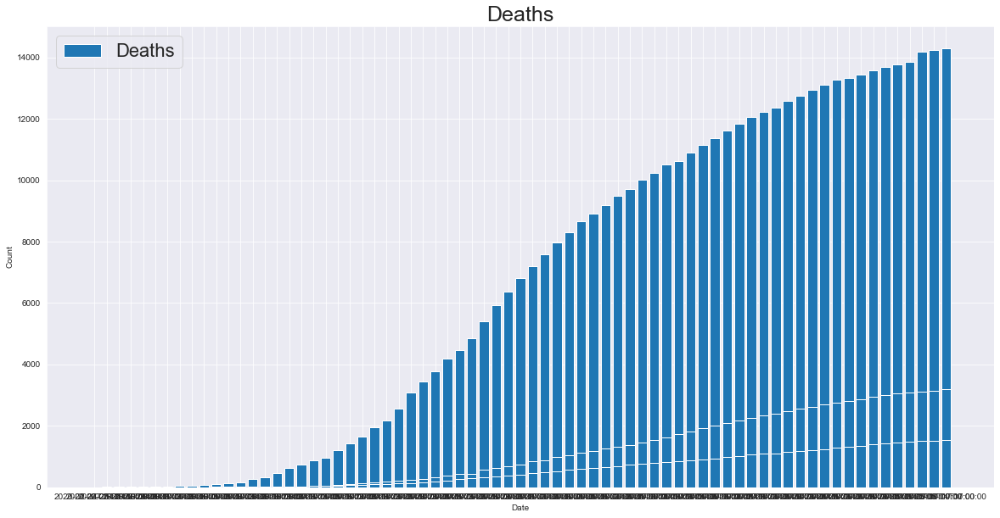

In [45]:
plt.figure(figsize=(20,10))
plt.bar(data.Date, data.Deaths,label="Deaths")
plt.xlabel('Date')
plt.ylabel("Count")
plt.legend(frameon=True, fontsize=22)
plt.title('Deaths',fontsize = 25)
plt.show()

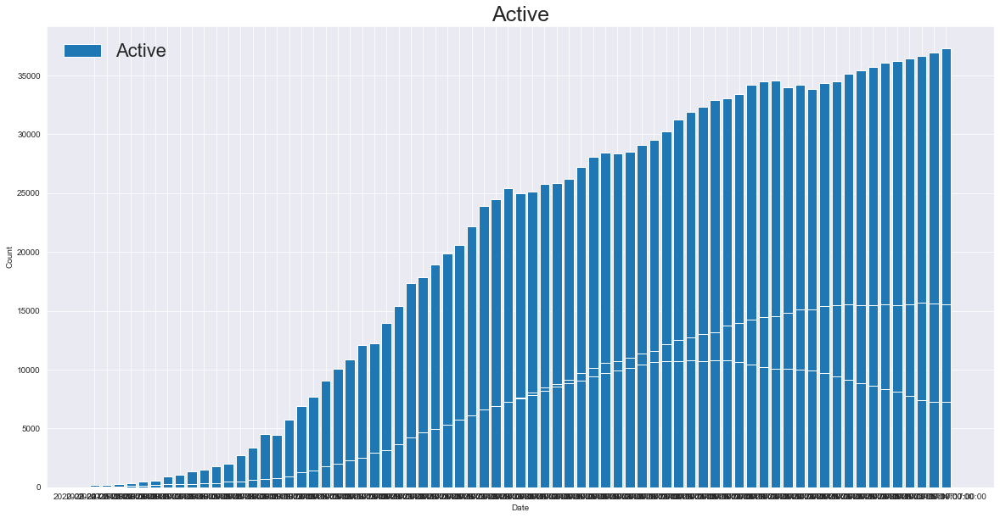

In [46]:
plt.figure(figsize=(20,10))
plt.bar(data.Date, data.Active,label="Active")
plt.xlabel('Date')
plt.ylabel("Count")
plt.legend(frameon=False, fontsize=22)
plt.title('Active',fontsize = 25)
plt.show()

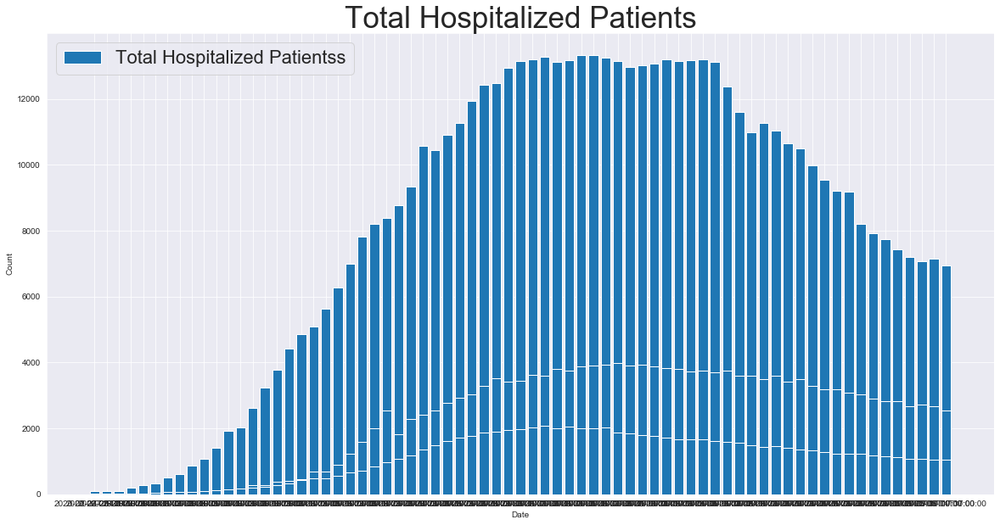

In [47]:
plt.figure(figsize=(20,10))
plt.bar(data.Date, data.TotalHospitalizedPatients,label="Total Hospitalized Patientss")
plt.xlabel('Date')
plt.ylabel("Count")
plt.legend(frameon=True, fontsize=22)
plt.title('Total Hospitalized Patients',fontsize = 35)
plt.show()

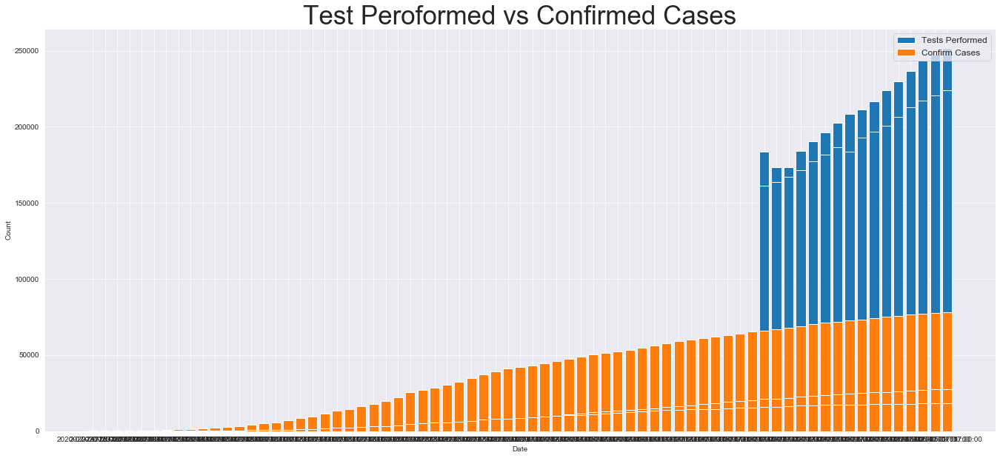

In [48]:
plt.figure(figsize=(23,10))
plt.bar(data.Date, data.TestsPerformed,label="Tests Performed")
plt.bar(data.Date, data.TotalPositiveCases,label="Confirm Cases")
plt.xlabel('Date')
plt.ylabel("Count")
plt.legend(frameon=True, fontsize=12)
plt.title('Test Peroformed vs Confirmed Cases',fontsize = 35)
plt.show()

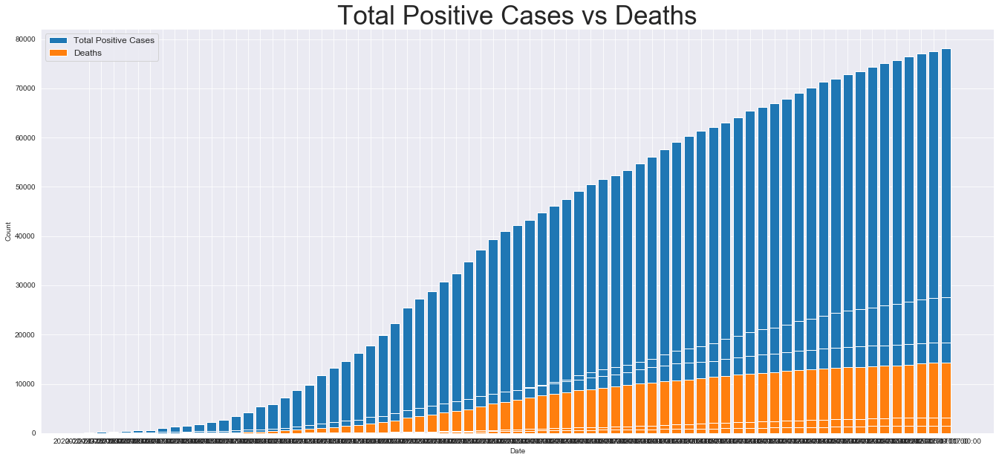

In [49]:
plt.figure(figsize=(23,10))
plt.bar(data.Date, data.TotalPositiveCases,label="Total Positive Cases")
plt.bar(data.Date, data.Deaths,label="Deaths")
plt.xlabel('Date')
plt.ylabel("Count")
plt.legend(frameon=True, fontsize=12)
plt.title('Total Positive Cases vs Deaths',fontsize = 35)
plt.show()

In [50]:
fig=px.bar(data,x='RegionName', y="TotalPositiveCases", animation_frame="Date", 
           animation_group="RegionName", color="RegionName", hover_name="RegionName")
fig.update_yaxes(range=[0, 25000])
fig.update_layout(title='Confirmed Cases vs Region')

In [51]:
fig = px.treemap(data, path=['RegionName'], values='TotalPositiveCases',
                  color='TotalPositiveCases', hover_data=['RegionName'],
                  color_continuous_scale='sunset')
fig.show()

In [52]:
fig1=px.bar(data,x='RegionName', y="Recovered", animation_frame="Date", 
           animation_group="RegionName", color="RegionName", hover_name="RegionName")
fig1.update_yaxes(range=[0, 25000])
fig1.update_layout(title='Recovered Cases vs Region')

In [53]:
fig1 = px.treemap(data, path=['RegionName'], values='Recovered',
                  color='Recovered', hover_data=['RegionName'],
                  color_continuous_scale='icefire')
fig1.show()

In [54]:
fig2=px.bar(data,x='RegionName', y="Deaths", animation_frame="Date", 
           animation_group="RegionName", color="RegionName", hover_name="RegionName")
fig2.update_yaxes(range=[0, 25000])
fig2.update_layout(title='Death Cases vs Region')

In [55]:
fig2 = px.treemap(data, path=['RegionName'], values='Deaths',
                  color='Deaths', hover_data=['RegionName'],
                  color_continuous_scale='plasma')
fig2.show()

In [56]:
fig3=px.bar(data,x='RegionName', y="TotalHospitalizedPatients", animation_frame="Date", 
           animation_group="RegionName", color="RegionName", hover_name="RegionName")
fig3.update_yaxes(range=[0, 25000])
fig3.update_layout(title='Hospitalised Patient vs Region')

In [57]:
fig3 = px.treemap(data, path=['RegionName'], values='TotalHospitalizedPatients',
                  color='TotalHospitalizedPatients', hover_data=['RegionName'],
                  color_continuous_scale='magma')
fig3.show()

In [58]:
fig4 = px.bar(data[['RegionName', 'TotalHospitalizedPatients']].sort_values('TotalHospitalizedPatients', ascending=False), 
             y="TotalHospitalizedPatients", x="RegionName", color='RegionName', 
             log_y=True, template='ggplot2', title='Hospitalised Patient vs Region')
fig4.show()

In [59]:
fig4 = px.treemap(data, path=['RegionName'], values='TotalHospitalizedPatients',
                  color='TotalHospitalizedPatients', hover_data=['RegionName'],
                  color_continuous_scale='plasma')
fig4.show()

In [60]:
province.head()

,SNo,Date,Country,RegionCode,Region,ProvinceCode,Province,ProvinceAbbreviation,Lat,Long,Confirmed
0,0,2020-02-24T18:00:00,ITA,13,Abruzzo,69,Chieti,CH,42.351032,14.167546,0
1,1,2020-02-24T18:00:00,ITA,13,Abruzzo,66,L'Aquila,AQ,42.351222,13.398438,0
2,2,2020-02-24T18:00:00,ITA,13,Abruzzo,68,Pescara,PE,42.464584,14.213648,0
3,3,2020-02-24T18:00:00,ITA,13,Abruzzo,67,Teramo,TE,42.658918,13.704400,0
4,4,2020-02-24T18:00:00,ITA,13,Abruzzo,979,In fase di definizione/aggiornamento,NaN,0.000000,0.000000,0


In [61]:
provincegrp = province.groupby("Province")[["Confirmed"]].max().reset_index()
provincegrp.head()

,Province,Confirmed
0,Agrigento,135
1,Alessandria,3593
2,Ancona,1819
3,Aosta,1143
4,Arezzo,651


In [62]:
fig = px.bar(provincegrp[['Province', 'Confirmed']].sort_values('Confirmed', ascending=False), 
             y="Confirmed", x="Province", color='Province', 
             log_y=True, template='plotly_dark', title='Province vs Confirmation')
fig.show()

In [63]:
fig = px.treemap(provincegrp, path=['Province'], values='Confirmed',
                  color='Confirmed', hover_data=['Province'],
                  color_continuous_scale='inferno')
fig.show()

In [67]:
temp = data.groupby('Date')['Recovered', 'Deaths', 'TotalPositiveCases'].sum().reset_index()
temp = temp.melt(id_vars="Date", value_vars=['Recovered', 'Deaths', 'TotalPositiveCases'],
                 var_name='Case', value_name='Count')
temp.head()

fig = px.area(temp, x="Date", y="Count", color='Case',
             title='Cases over time', color_discrete_sequence = ['yellow','blue','red'])
fig.show()

C:\Users\Saabia\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [69]:
data.head()

,SNo,Date,Country,RegionCode,RegionName,Latitude,Longitude,HospitalizedPatients,IntensiveCarePatients,TotalHospitalizedPatients,HomeConfinement,CurrentPositiveCases,NewPositiveCases,Recovered,Deaths,TotalPositiveCases,TestsPerformed,Active
0,0,2020-02-24T18:00:00,ITA,13,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,NaN,0
1,1,2020-02-24T18:00:00,ITA,17,Basilicata,40.639471,15.805148,0,0,0,0,0,0,0,0,0,NaN,0
2,2,2020-02-24T18:00:00,ITA,4,P.A. Bolzano,46.499335,11.356624,0,0,0,0,0,0,0,0,0,NaN,0
3,3,2020-02-24T18:00:00,ITA,18,Calabria,38.905976,16.594402,0,0,0,0,0,0,0,0,0,NaN,0
4,4,2020-02-24T18:00:00,ITA,15,Campania,40.839566,14.250850,0,0,0,0,0,0,0,0,0,NaN,0
